**Those who do not wear headphones are not allowed to continue reading this notebook**

# installs and shit

In [ ]:
from IPython.display import Audio, display
import zipfile
import os
import librosa
import numpy as np
import librosa.display
import matplotlib.pyplot as plt
import sklearn
import mido
from tensorflow.keras import layers, models

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#  Preprocess model

In [ ]:
class Preprocess:
  def __init__(self,pop_zip_dir,lofi_zip_dir):
    self.preprocess_dict = {}
    self.pop_zip_dir = pop_zip_dir
    self.lofi_zip_dir = lofi_zip_dir
    self.midi_files = {}

  def unzip_lofi(self):
    self.raw_lofi_dir = self.unzip(self.lofi_zip_dir)

  def unzip_pop(self):
    self.raw_pop_dir = self.unzip(self.pop_zip_dir)

  def unzip(self,zip_file_path):
    # Get the directory of the ZIP file
    zip_file_directory = os.path.dirname(zip_file_path)
    # Extract the ZIP file name without the extension
    zip_file_name_without_extension = os.path.basename(zip_file_path).rsplit('.', 1)[0]
    # Define the directory to extract its contents
    extract_to_directory = os.path.join(zip_file_directory, zip_file_name_without_extension)
    # Ensure the extraction directory exists
    os.makedirs(extract_to_directory, exist_ok=True)
    # Open the ZIP file in read mode
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
      # Extract all the contents into the directory
      zip_ref.extractall(extract_to_directory)
      print("Extraction complete. Extracted to " + extract_to_directory)
    return extract_to_directory

  def present_5_songs(self,lofi_or_pop):
    dir = self.raw_lofi_dir if lofi_or_pop == 'lofi' else self.raw_pop_dir
    # List all files in the folder
    song_files = [f for f in os.listdir(dir) if os.path.isfile(os.path.join(dir, f))]
    # Limit to the first 5 songs
    first_5_songs = song_files[:5]
    # Display an Audio widget for each of the first 5 song files
    for song in first_5_songs:
        display(Audio(filename=os.path.join(dir, song)))
        print(f"Now playing: {song}")

  def audio_to_midi(self):
    # List all files in the folder
    audio_files = [f for f in os.listdir(self.raw_pop_dir) if os.path.isfile(os.path.join(self.raw_pop_dir, f))]
    # Iterate over all audio files
    for audio_file in audio_files:
        # Construct the full path of the audio file
        full_audio_path = os.path.join(self.raw_pop_dir, audio_file)
        # Load audio file
        y, sr = librosa.load(full_audio_path)
        # Extract features (example: pitches)
        pitches, magnitudes = librosa.piptrack(y=y, sr=sr)
        # Convert pitches to MIDI notes (example: mapping to closest MIDI notes)
        midi_notes = [int(librosa.hz_to_midi(pitch)) for pitch in pitches]
        # Create MIDI file
        midi_file = mido.MidiFile()
        track = mido.MidiTrack()
        # Add MIDI notes to track
        for note in midi_notes:
            # Example: Add note-on and note-off events
            track.append(mido.Message('note_on', note=note, velocity=64, time=0))
            track.append(mido.Message('note_off', note=note, velocity=64, time=100))
        # Add track to MIDI file
        midi_file.tracks.append(track)
        # Save MIDI file as binary data
        midi_data = io.BytesIO()
        midi_file.save(file=midi_data)
        # Store the MIDI file binary data
        self.midi_files[audio_file] = midi_data.getvalue()



In [ ]:
pop_raw_zip_path = '/content/drive/MyDrive/ML-beats-test-data/raw_pop_small_10.zip'
lofi_raw_songs_zip_path = '/content/drive/MyDrive/ML-beats-test-data/raw_lofi_small_10.zip'
preprocess = Preprocess(pop_raw_zip_path,lofi_raw_songs_zip_path)


In [ ]:
preprocess.unzip_pop()

Extraction complete. Extracted to /content/drive/MyDrive/ML-beats-test-data/raw_pop_small_10


In [ ]:
preprocess.unzip_lofi()

Extraction complete. Extracted to /content/drive/MyDrive/ML-beats-test-data/raw_lofi_small_10


#  Loading Audio Files

In [ ]:
preprocess.present_5_songs('lofi')

Now playing: Addict - Can You Imagine (feat Solace).mp4


Now playing: Addict - Goodbye.mp4


Now playing: Addict - I Like U (ft SAMI).mp4


Now playing: Addict - Kiss You.mp4


Now playing: Addict - Youre Gone.mp4


In [ ]:
# Load an audio file as a waveform `y`
# and its sampling rate `sr`
filename = '/content/drive/MyDrive/ML-beats-test-data/raw_lofi_small_10/Adam Youngman - Watch Me Drown.mp4'
y, sr = librosa.load(filename, sr=None)  # `sr=None` loads the native sampling rate

<ipython-input-48-ecb5e2c979d5>:4: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(filename, sr=None)  # `sr=None` loads the native sampling rate
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:183: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


# Generating Spectrograms

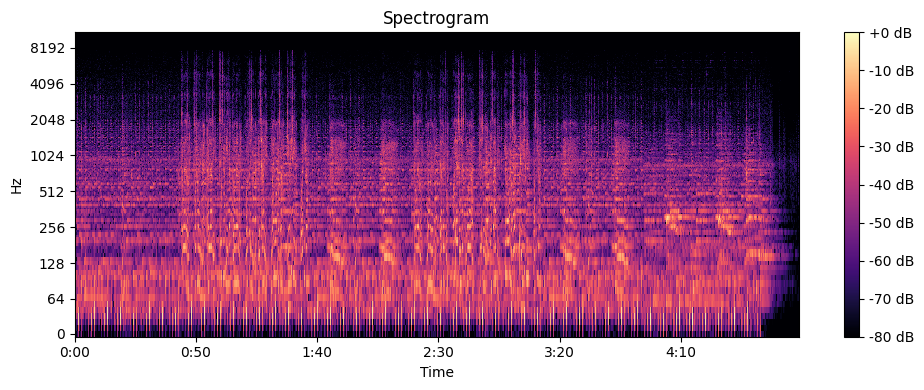

In [ ]:
# Compute the spectrogram magnitude and phase
S_full, phase = librosa.magphase(librosa.stft(y))

plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max), y_axis='log', x_axis='time')
plt.title('Spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
plt.show()

# Computing Mel-Frequency Cepstral Coefficients (MFCCs)

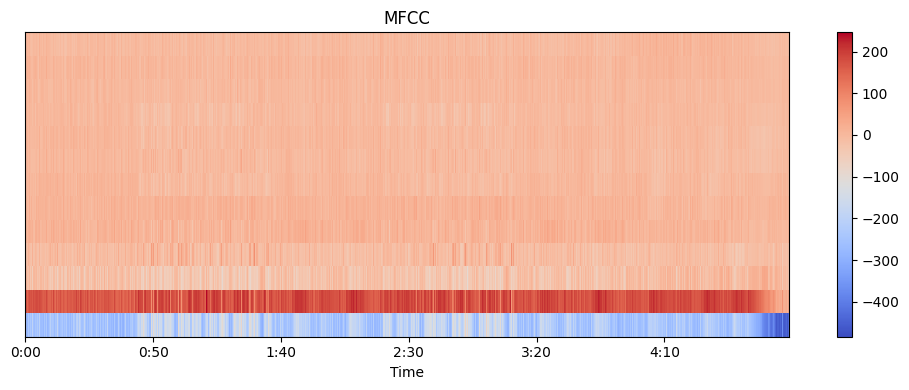

In [ ]:
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

plt.figure(figsize=(10, 4))
librosa.display.specshow(mfccs, x_axis='time')
plt.colorbar()
plt.title('MFCC')
plt.tight_layout()
plt.show()

# Normalization

In [ ]:
from sklearn.preprocessing import scale

# Assuming `mfccs` are the Mel-Frequency Cepstral Coefficients from your earlier step
# Normalize MFCCs across the coefficient dimension
mfccs_normalized = scale(mfccs, axis=1)

# Verify minimum and maximum values of normalized MFCCs
print(mfccs_normalized.min(), mfccs_normalized.max())

-5.397565 5.3874087


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_data.py:240: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_data.py:259: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn(


To build a deep learning model that learns to combine non-lofi melodies with the aesthetic of lofi music, we can consider a conditional Generative Adversarial Network (cGAN) approach, where the condition is the melody (in a processed form, such as MIDI or piano roll representation) and the target output is a lofi song (represented as a spectrogram). The key steps involve preprocessing your data, designing the model architecture, and training the model.

1. **Data Preprocessing**


*   Melodies (MIDI Files): Convert MIDI files into a format that can be fed into the neural network. A common approach is to use a piano roll representation, where the x-axis represents time, the y-axis represents pitch, and the cells
*   contain velocity (intensity) of the note.
Lofi Songs (Audio Files): Convert the audio files into spectrograms, which provide a visual representation of the spectrum of frequencies of a signal as it varies with time.


2. **Model Architecture**


*   Generator
** Input: The generator takes two inputs: a noise vector (to generate variability in the output) and a conditioned input derived from the melody's piano roll representation.
** Architecture: The generator's architecture might start with a fully connected layer to upscale the combined input, followed by several transposed convolutional layers (Conv2DTranspose in Keras) to upscale to the desired output size, which is the spectrogram of the generated lofi song.
*Discriminator

** Input: The discriminator receives either a real lofi song spectrogram or a generated spectrogram from the Generator.
** Architecture: It could be a series of convolutional layers that downsample the input, followed by a fully connected layer that outputs the probability of the input being real or fake.
3. **Training the cGAN**
* Objective: Train the Generator to produce spectrograms that are indistinguishable from real lofi song spectrograms, conditioned on the input melody, while training the Discriminator to accurately distinguish between real and generated spectrograms.
* Process: Alternate between training the Discriminator on real and fake data, and training the Generator based on the Discriminator's feedback.
4. **Generating Music**
After training, to generate music with a given melody, you input the processed melody and a noise vector into the Generator. The output will be a spectrogram of the generated lofi song, which you can then convert back to audio.
**Example Skeleton Code**


Below is a simplified example to illustrate how you might start implementing this with TensorFlow and Keras. Note that this is a conceptual example; real implementation will require detailed design, tuning, and ample data.

In [ ]:
melody_shape =
noise_dim =200
def build_generator():
    # Assuming melody_shape and noise_dim are predefined
    melody_input = layers.Input(shape=melody_shape)
    noise_input = layers.Input(shape=(noise_dim,))
    x = layers.concatenate([melody_input, noise_input])
    x = layers.Dense(256, activation="relu")(x)
    # Transposed convolutions to upscale to the desired output shape (the spectrogram size)
    x = layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding="same", activation="relu")(x)
    x = layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="same", activation="tanh")(x)
    return models.Model([melody_input, noise_input], x)

def build_discriminator(spectrogram_shape):
    spectrogram_input = layers.Input(shape=spectrogram_shape)
    x = layers.Conv2D(64, kernel_size=3, strides=2, padding="same")(spectrogram_input)
    x = layers.LeakyReLU(alpha=0.2)(x)
    x = layers.Flatten()(x)
    x = layers.Dense(1, activation="sigmoid")(x)
    return models.Model(spectrogram_input, x)

# Example training loop, model setup, and music generation code are omitted for brevity


https://www.youtube.com/watch?v=pwV8K9wXY2E&list=PL-wATfeyAMNpEyENTc-tVH5tfLGKtSWPp&index=2